# LOG
画像データの配列の255をindex数にしたバージョン、精度出た。

In [71]:
# 機械学習のライブラリ関連をインポート
import pandas as pd
import numpy as np

# ランダムにシャッフルして，学習・テストに分割するモジュール
from sklearn.model_selection import ShuffleSplit

# 深層学習のライブラリをインポート
import tensorflow as tf
import tensorflow.keras as keras

#表示系のインポートと設定
%matplotlib inline
import matplotlib.pyplot as plt

# ファイル操作
import os

# 画像操作
from PIL import Image

In [211]:
# DIRS
DIRS_DATASET = "../Training/Datasets100/"

In [212]:
file_names = []
    
# フォルダ内のファイルを取得
files = os.listdir(DIRS_DATASET)

# ファイル名を配列に格納
for file in files:
    file_names.append(file)

# Pythonリスト型をnumpy.ndarray型に変換
file_names = np.array(file_names)


In [213]:
file_names

array(['4514900744602.jpeg', '4522961871969.jpeg', '4523310865860.jpeg',
       '4525133425725.jpeg', '4525818159647.jpeg', '4526602078789.jpeg',
       '4526635480532.jpeg', '4531174104395.jpeg', '4532709039737.jpeg',
       '4536599448182.jpeg', '4537665190009.jpeg', '4542355592435.jpeg',
       '4542828412659.jpeg', '4543328979046.jpeg', '4546304917471.jpeg',
       '4548421544795.jpeg', '4548815692356.jpeg', '4554005439296.jpeg',
       '4555341012380.jpeg', '4555908273279.jpeg', '4557428664528.jpeg',
       '4559707818001.jpeg', '4561390594460.jpeg', '4561986791955.jpeg',
       '4562449593172.jpeg', '4562786497793.jpeg', '4563341213413.jpeg',
       '4564019786690.jpeg', '4566141729222.jpeg', '4569731864236.jpeg',
       '4569855703387.jpeg', '4571624618131.jpeg', '4572463589359.jpeg',
       '4573159267459.jpeg', '4573720017478.jpeg', '4574315642382.jpeg',
       '4575611133893.jpeg', '4577147103255.jpeg', '4580172534685.jpeg',
       '4580567714297.jpeg', '4581399231338.jpeg', 

In [214]:
# # 学習データとテストデータのインデックスを作成
# train_index, test_index = next(ss.split(file_names))

In [215]:
# file_names_train, file_names_test = file_names[train_index], file_names[test_index] # 学習データ，テストデータ

### 画像をnumpy配列にするための関数

In [216]:
def jpeg_to_numpy(image_path):
    # JPEG画像を開く
    image = Image.open(image_path)
    # NumPy配列に変換
    numpy_array = np.array(image)
    
    return numpy_array

def convert_to_grayscale(numpy_array):
    # グレーと言わず2値化
    grayscale_array = np.where(numpy_array <= 128, 0, 255)
    plt.imshow(grayscale_array)
    print(grayscale_array)
    return grayscale_array


### 画像を配列にしてよしなに

In [217]:
X, y = [], []

[[[  0   0   0]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [  0   0   0]
  [255 255 255]
  [255 255 255]
  [255 2

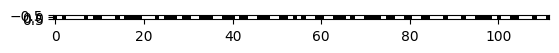

In [218]:
for file_name in file_names:
    numpy_array = jpeg_to_numpy(DIRS_DATASET + file_name)
    grayscale_array = convert_to_grayscale(numpy_array)
    for i in range(13):
        X.append(np.where(grayscale_array == 255, i+1, 0))
        y.append(file_name[i])

In [219]:
X = np.array(X)
y = np.array(y, dtype=int)

In [220]:
X

array([[[[ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 

In [221]:
y

array([4, 5, 1, 4, 9, 0, 0, 7, 4, 4, 6, 0, 2, 4, 5, 2, 2, 9, 6, 1, 8, 7,
       1, 9, 6, 9, 4, 5, 2, 3, 3, 1, 0, 8, 6, 5, 8, 6, 0, 4, 5, 2, 5, 1,
       3, 3, 4, 2, 5, 7, 2, 5, 4, 5, 2, 5, 8, 1, 8, 1, 5, 9, 6, 4, 7, 4,
       5, 2, 6, 6, 0, 2, 0, 7, 8, 7, 8, 9, 4, 5, 2, 6, 6, 3, 5, 4, 8, 0,
       5, 3, 2, 4, 5, 3, 1, 1, 7, 4, 1, 0, 4, 3, 9, 5, 4, 5, 3, 2, 7, 0,
       9, 0, 3, 9, 7, 3, 7, 4, 5, 3, 6, 5, 9, 9, 4, 4, 8, 1, 8, 2, 4, 5,
       3, 7, 6, 6, 5, 1, 9, 0, 0, 0, 9, 4, 5, 4, 2, 3, 5, 5, 5, 9, 2, 4,
       3, 5, 4, 5, 4, 2, 8, 2, 8, 4, 1, 2, 6, 5, 9, 4, 5, 4, 3, 3, 2, 8,
       9, 7, 9, 0, 4, 6, 4, 5, 4, 6, 3, 0, 4, 9, 1, 7, 4, 7, 1, 4, 5, 4,
       8, 4, 2, 1, 5, 4, 4, 7, 9, 5, 4, 5, 4, 8, 8, 1, 5, 6, 9, 2, 3, 5,
       6, 4, 5, 5, 4, 0, 0, 5, 4, 3, 9, 2, 9, 6, 4, 5, 5, 5, 3, 4, 1, 0,
       1, 2, 3, 8, 0, 4, 5, 5, 5, 9, 0, 8, 2, 7, 3, 2, 7, 9, 4, 5, 5, 7,
       4, 2, 8, 6, 6, 4, 5, 2, 8, 4, 5, 5, 9, 7, 0, 7, 8, 1, 8, 0, 0, 1,
       4, 5, 6, 1, 3, 9, 0, 5, 9, 4, 4, 6, 0, 4, 5,

In [222]:
# ラベルデータをone-hotベクトルに直す
labels = {
    0: [1, 0, 0, 0, 0, 0, 0, 0, 0, 0], 
    1: [0, 1, 0, 0, 0, 0, 0, 0, 0, 0], 
    2: [0, 0, 1, 0, 0, 0, 0, 0, 0, 0], 
    3: [0, 0, 0, 1, 0, 0, 0, 0, 0, 0], 
    4: [0, 0, 0, 0, 1, 0, 0, 0, 0, 0], 
    5: [0, 0, 0, 0, 0, 1, 0, 0, 0, 0], 
    6: [0, 0, 0, 0, 0, 0, 1, 0, 0, 0], 
    7: [0, 0, 0, 0, 0, 0, 0, 1, 0, 0], 
    8: [0, 0, 0, 0, 0, 0, 0, 0, 1, 0], 
    9: [0, 0, 0, 0, 0, 0, 0, 0, 0, 1], 
}

y = np.array(list(map(lambda v : labels[v] , y)))

In [223]:
np.set_printoptions(threshold=1000000)
y

array([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0,

### データの分割

In [224]:
ss = ShuffleSplit(n_splits=1,      # 分割を1個生成
                  train_size=0.8,  # 学習は半分
                  test_size =0.2,  # テストも半分
                  random_state=0)  # 乱数種（再現用）

# 学習データとテストデータのインデックスを作成
train_index, test_index = next(ss.split(X))

X_train, X_test = X[train_index], X[test_index] # 学習データ，テストデータ
y_train, y_test = y[train_index], y[test_index] # 学習データのラベル，テストデータのラベル

In [225]:
X

array([[[[ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 1,  1,  1],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 

In [226]:
y

array([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 1, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 1, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 1, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 1],
       [0, 0, 0, 0, 0, 0, 1, 0, 0, 0],
       [0, 0, 0, 0, 0, 0,

In [227]:
X_train.shape[0], X_train.shape[1], X_train.shape[2], X_train.shape[3] 

(1040, 1, 112, 3)

In [228]:
X_train

array([[[[ 0,  0,  0],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 0,  0,  0],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 6,  6,  6],
         [ 

### ニューラルネットワークの構築

In [231]:

# 学習し、テストデータで評価し、スコアを表示する
# 引数は、中間層の数、バッチサイズ、epoch数

def fit_epoch(neuron, batch, epochs):
    
    # レイヤーのオブジェクトを作成
    Dense = keras.layers.Dense

    # モデルの構造を定義
    model = keras.models.Sequential()
    model.add(tf.keras.layers.Flatten(input_shape=(1, 112, 3)))
    model.add(Dense(neuron, activation='relu'))
    model.add(Dense(10, activation='softmax')) # 10つのラベルがありsoftmaxで最後の層作る

    # モデルを構築
    model.compile(
    loss='categorical_crossentropy',
    optimizer='Adamax',
    metrics=['accuracy'])

    # 学習を実行
    hist = model.fit(X_train, y_train,
        batch_size=batch, # 誤差逆伝播法をするときの1回当たりのデータ数
        epochs=epochs,
        verbose=1,
        validation_split=0.1)
    
   # モデルを評価
    score = model.evaluate(X_test, y_test, verbose=1)
    print('正解率=', score[1], 'loss=', score[0])
    
     # 学習の様子をグラフへ描画 
    # 正解率の推移をプロット
    plt.plot(hist.history['accuracy'])
    plt.plot(hist.history['val_accuracy'])
    plt.title('Accuracy')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()

    # ロスの推移をプロット
    plt.plot(hist.history['loss'])
    plt.plot(hist.history['val_loss'])
    plt.title('Loss')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()   

Epoch 1/2000
3/3 [==============================] - 1s 116ms/step - loss: 6.6929 - accuracy: 0.1165 - val_loss: 6.1952 - val_accuracy: 0.1154
Epoch 2/2000
3/3 [==============================] - 0s 24ms/step - loss: 5.5620 - accuracy: 0.1132 - val_loss: 5.7760 - val_accuracy: 0.0962
Epoch 3/2000
3/3 [==============================] - 0s 23ms/step - loss: 4.6716 - accuracy: 0.1335 - val_loss: 5.1671 - val_accuracy: 0.1346
Epoch 4/2000
3/3 [==============================] - 0s 24ms/step - loss: 4.1131 - accuracy: 0.1464 - val_loss: 4.2768 - val_accuracy: 0.0769
Epoch 5/2000
3/3 [==============================] - 0s 22ms/step - loss: 3.4952 - accuracy: 0.1859 - val_loss: 3.7593 - val_accuracy: 0.1731
Epoch 6/2000
3/3 [==============================] - 0s 29ms/step - loss: 3.0044 - accuracy: 0.1677 - val_loss: 3.3122 - val_accuracy: 0.1731
Epoch 7/2000
3/3 [==============================] - 0s 30ms/step - loss: 2.6196 - accuracy: 0.1688 - val_loss: 3.0430 - val_accuracy: 0.1154
Epoch 8/2000

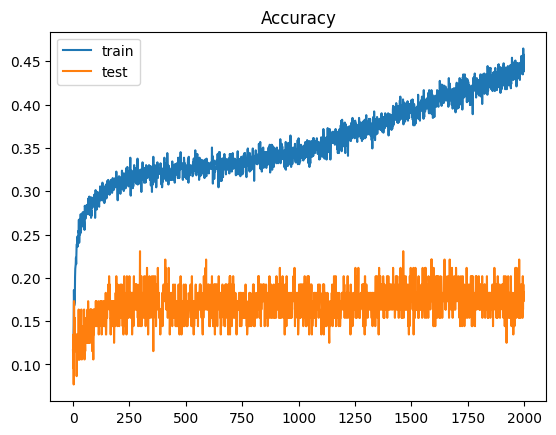

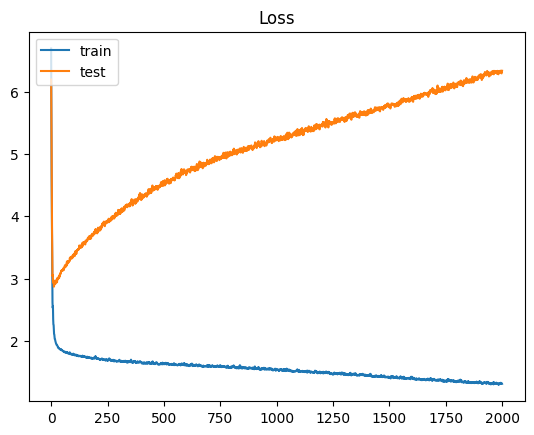

CPU times: total: 22.5 s
Wall time: 2min 9s


In [235]:
%%time
fit_epoch(512,390, 2000)